the bottom 2 pannels initalize and hold the data set. 


I am personally using the funnled dataset becuse it straitens the faces to make it easier to get the featurs of the faces without worrying about if the face is tilted or not. it w=makes it easier to find faces that match. as calculating the distance bettween featurs will be mutch easier.

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#!tar -xvf  drive/My\ Drive/lfw.tgz
!tar -xvf  drive/My\ Drive/lfw-deepfunneled.tgz
#!pip install tensorflow-io
#!pip install elasticsearch

#Reverse Image Search - Baseline (30 points)

the bottom few are my basline codes they do not perform well. but they do try their hardest to feature match. 

In the bottom code you can see that we are finding the fatial featerus of all the people in our data set so when we query the dataset latter we caould easilly find it and and we wont have to wait as long to find similar matches every time. i tried to download the list of features of the faces but everytime i tried it would save weirdly and when i tried to access it i wouldnt be able to. so for now i will just have to keep on refinding the features of the faces everytime I restart the nootbook

In [ ]:
# Import the libraries
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
from pathlib import Path
from PIL import Image
img_feature = {}

#the below feature extractor works on the whole images are already of only the faces so it will be easier for us to only match the whole image 
#instead of first bound boxing everyimage which will also take very long
#we will use the basic model provided by keras as when i tried to make a model myself it didnt work sadly and was giving me errors for size differences

class FeatureExtractor:
    def __init__(self):
        # Use VGG-16 as the architecture and ImageNet for the weight
        base_model = VGG16(weights='imagenet')
        # Customize the model to return features from fully-connected layer
        self.model = Model(inputs=base_model.input, outputs=base_model.get_layer('fc1').output)
    def extract(self, img):
        # Resize the image
        img = img.resize((224, 224))
        # Convert the image color space
        img = img.convert('RGB')
        # Reformat the image
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
        # Extract Features
        feature = self.model.predict(x)[0]
        return feature / np.linalg.norm(feature)


# Iterate through images (Change the path based on your image location)
fe = FeatureExtractor()
i=0
directory = "code/lfw-deepfunneled"
for folder in os.listdir(directory): 
  i+=1
  print(i)
  f = os.path.join(directory, folder)
  for img_name in os.listdir(f):
    img_path= os.path.join(f, img_name)    
    # Extract Features
    feature = fe.extract(img=Image.open(img_path))
    # Save the Numpy array (.npy) on designated path
    img_feature[img_path] = feature


bottom 10 cells are our query cells where we enter an image of our choice and it will try to find find similar faces to the face we have quered. it will first get the features of the quered image which will then try to find the distance between the features. if the features of the face are similar the distinces will be smaller compared to the other faces. as you can see below the image that we queried was in the database so it rutrned the image and 19 others as we will return the top 20 images. 


ps. i dont maybe the pictures arnt good enough but it did not match face featuers properly. as you can see from the bellow results 

Albert Costa 



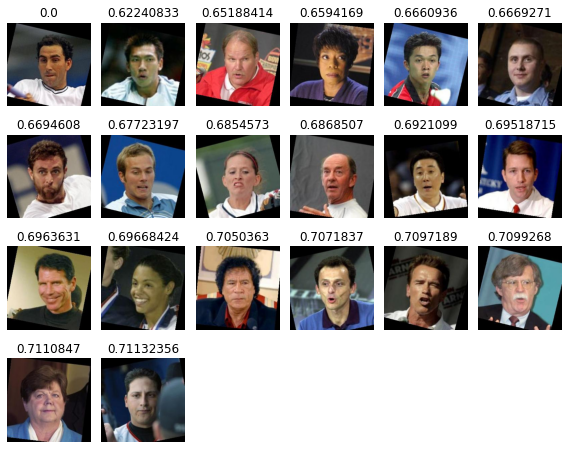

In [14]:
print("Albert Costa \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Albert_Costa/Albert_Costa_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Angela Bassett 



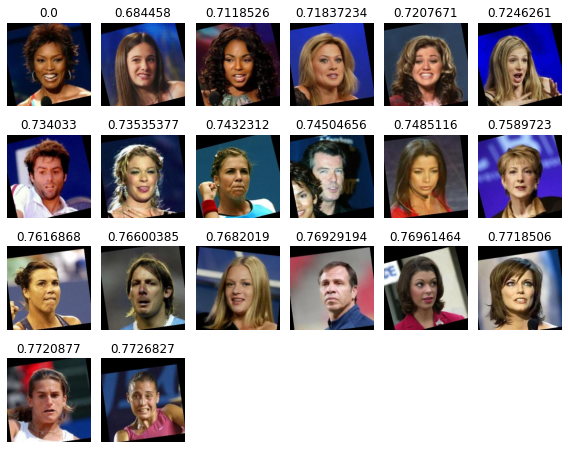

In [17]:
print("Angela Bassett \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Angela_Bassett/Angela_Bassett_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Arminio Fraga 



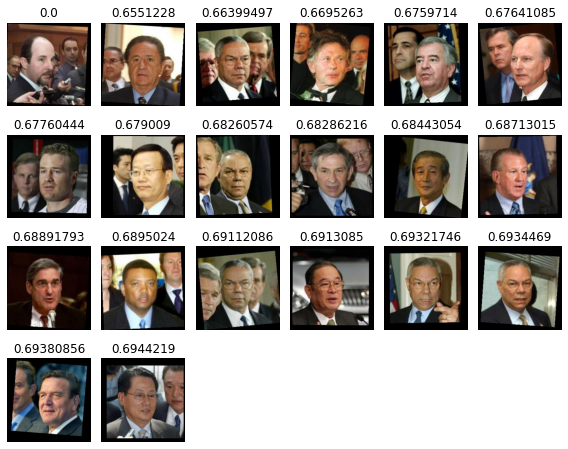

In [20]:
print("Arminio Fraga \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Arminio_Fraga/Arminio_Fraga_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Billy Crystal 



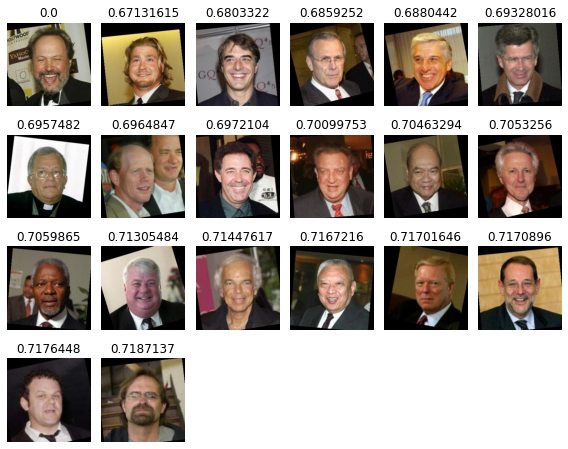

In [21]:
print("Billy Crystal \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Billy_Crystal/Billy_Crystal_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Bob Graham 



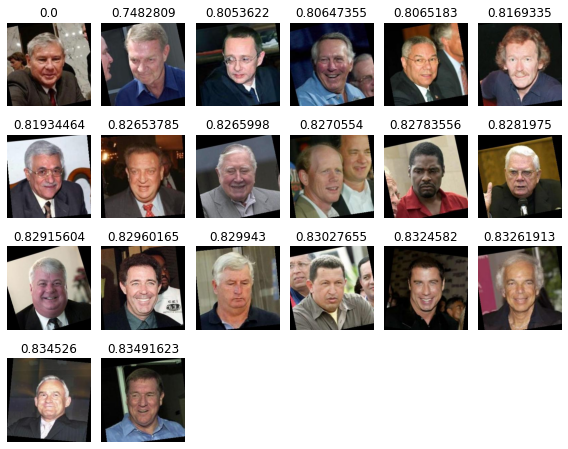

In [22]:
print("Bob Graham \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Bob_Graham/Bob_Graham_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Boris Becker 



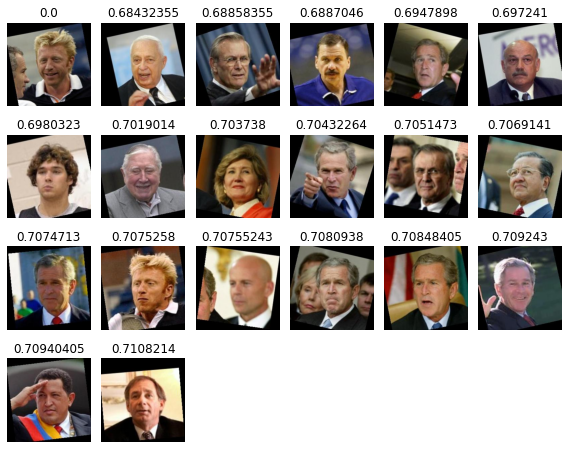

In [23]:
print("Boris Becker \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Boris_Becker/Boris_Becker_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Bulent Ecevit 



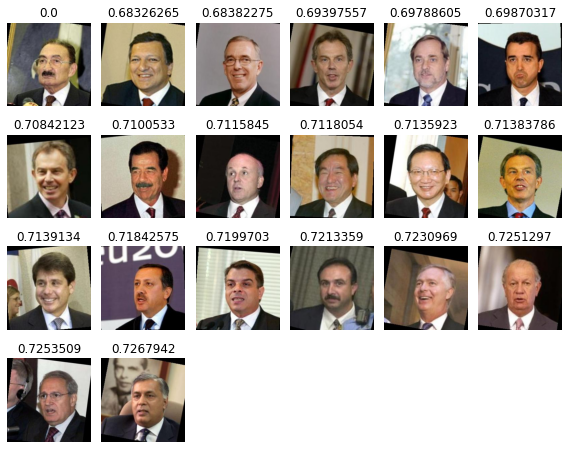

In [24]:
print("Bulent Ecevit \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Bulent_Ecevit/Bulent_Ecevit_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Calista Flockhart 



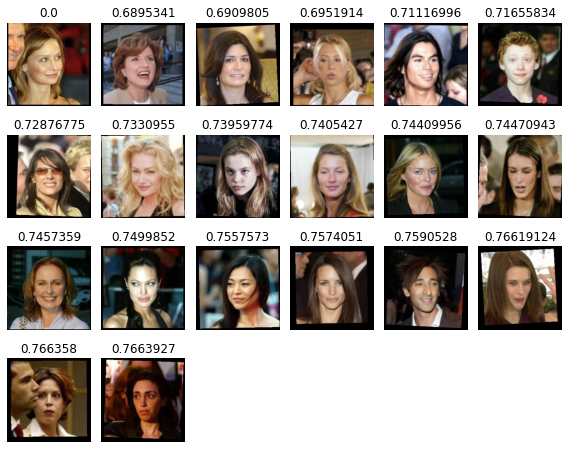

In [25]:
print("Calista Flockhart \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Calista_Flockhart/Calista_Flockhart_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Cameron Diaz 



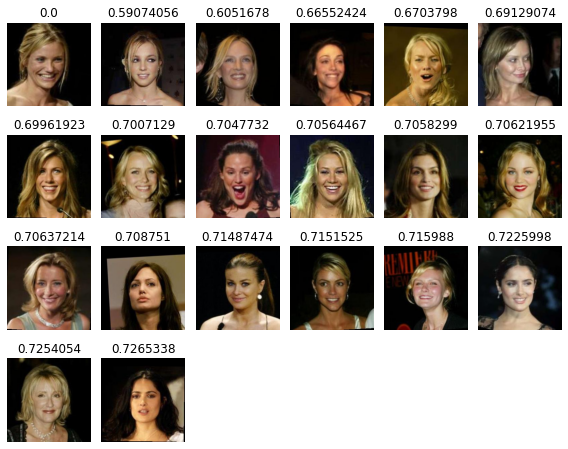

In [28]:
print("Cameron Diaz \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Cameron_Diaz/Cameron_Diaz_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Carmen Electra 



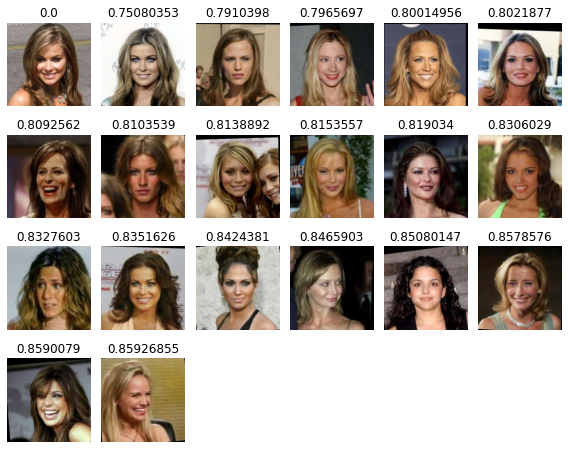

In [29]:
print("Carmen Electra \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("code/lfw-deepfunneled/Carmen_Electra/Carmen_Electra_0001.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in img_feature:
  feat_dist[key] = np.linalg.norm(img_feature[key] - query)

# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

#Reverse Image Search Improvement (30 points) 

In the bellow codes i have used face_recognition api which balsts my basline away that cant recognise anything properly. 

In [15]:
#!pip install mtcnn 
#!pip install keras_vggface
#!pip install deepface
!pip3 install cmake face_recognition numpy opencv-python





  Using cached face_recognition-1.3.0-py2.py3-none-any.whl (15 kB)
  Using cached click-8.1.2-py3-none-any.whl (96 kB)


In [ ]:

import face_recognition
import cv2
import numpy as np
import os
import glob

faces_encodings = {}
i=0
directory = "code/lfw-deepfunneled"
n = 0
for folder in os.listdir(directory): 
  i=0
  print(n)
  i+=1
  n+=1
  f = os.path.join(directory, folder)
  for img_name in os.listdir(f):
    img_path= os.path.join(f, img_name)
    recognition = face_recognition.load_image_file(img_path)
    en = face_recognition.face_encodings(recognition)
    faces_encodings[img_path] = en

Albert Costa 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.7221930290592938, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.6791329991389427, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.7057135221903316, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.6474287714121872, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.7848791228487244, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.8833429539935739, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.8217034885673263, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9113772322016465, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.8998296160598546, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.9295080381222396, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.7626255343140141, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.7582224212098349, 'code/lfw-deep

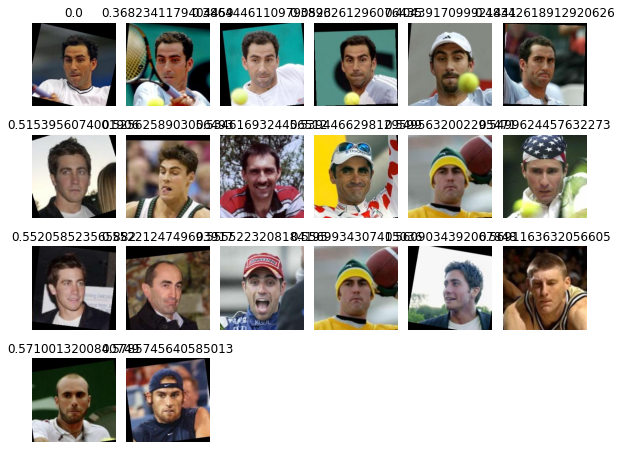

In [41]:
print("Albert Costa \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Albert_Costa/Albert_Costa_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Angela Bassett 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.9388559440621701, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.9819299908087159, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.9489306231718327, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.9449573608546962, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.933462236349754, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.9315791966743531, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 1.039017786932405, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.7761264616768853, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 1.0081927620465625, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.9877324052061754, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.9865971782501937, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.8187525773299829, 'code/lfw-deep

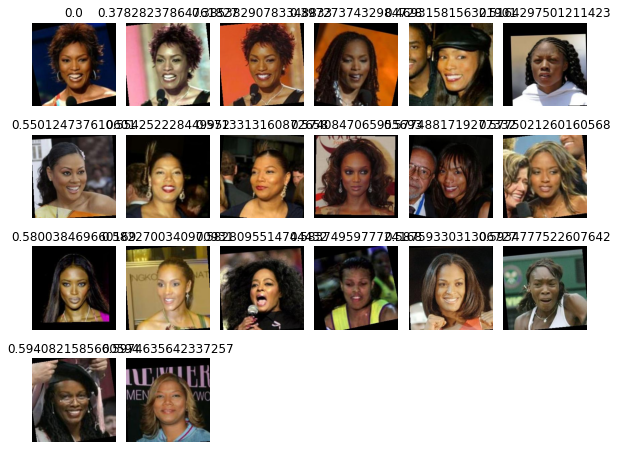

In [44]:
print("Angela Bassett \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Angela_Bassett/Angela_Bassett_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Arminio Fraga 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.763025850332941, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.7332856367846179, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.7437341881073827, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.7825470012268168, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.8823767021160411, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.9000555297349667, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.72579849872701, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9498326140627816, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.9167285522938559, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.9133068957850085, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.6471925769430852, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.9031487398684603, 'code/lfw-deepfu

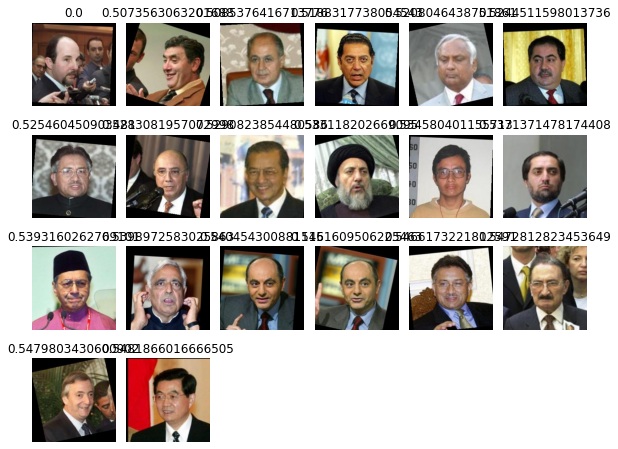

In [53]:
print("Arminio Fraga \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Arminio_Fraga/Arminio_Fraga_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key][0], en[0]))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Albert Costa 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.8202069319141322, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.8390392729558894, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.7641394105307281, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.8015735986807683, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.8318688576404448, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.8300608635162725, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.8651520398568207, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9108233527434775, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.7507165384277223, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.7488553690853066, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.801554017893314, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.8350682973813284, 'code/lfw-deepf

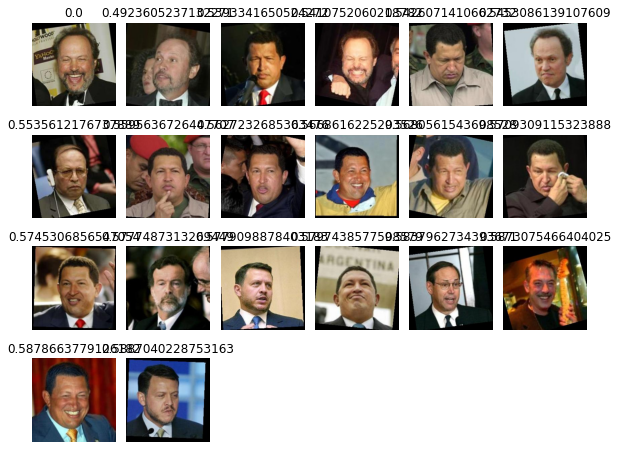

In [54]:
print("Albert Costa \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Billy_Crystal/Billy_Crystal_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Bob Graham 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.6926079845278189, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.8252726122568167, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.729114376630612, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.7774615352276609, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.8269755442332001, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.8063881533275549, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.747695614786747, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.819989528196482, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.7237047305580379, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.7159032533052231, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.772951195051402, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.7699985827695043, 'code/lfw-deepfunnel

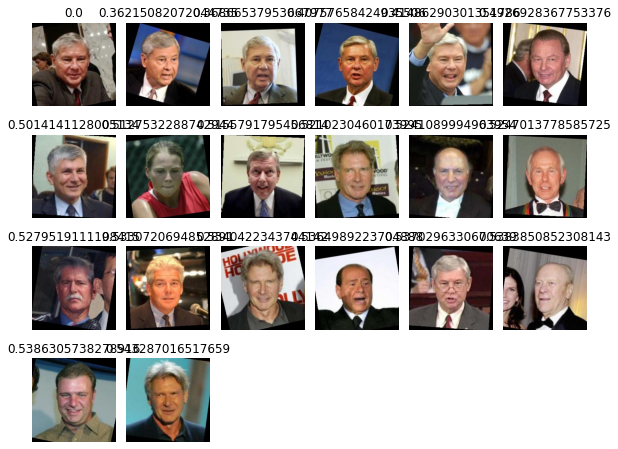

In [55]:
print("Bob Graham \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Bob_Graham/Bob_Graham_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Boris Becker 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.8036709042854654, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.8043006432808242, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.8559953728232448, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.7766732134213622, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.8210752047456282, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.8200627326690303, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.75796313547359, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9000085194792419, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.7560127703125841, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.7131285714459921, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.8509291162838725, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.9136647063372, 'code/lfw-deepfunne

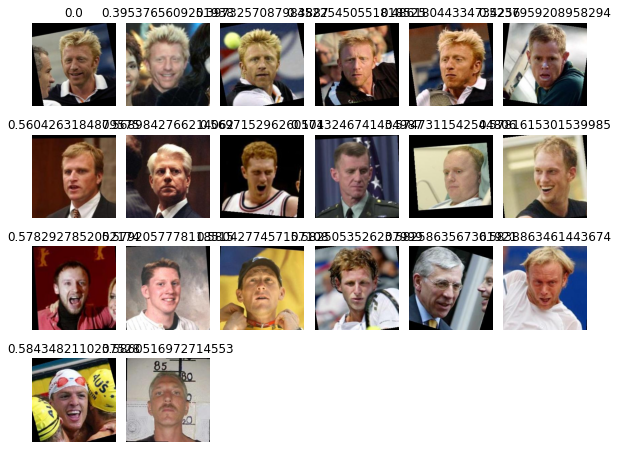

In [59]:
print("Boris Becker \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Boris_Becker/Boris_Becker_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Bulent Ecevit 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.830978180562158, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.7414706272255567, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.7261917824440411, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.7439274153637178, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.9102656648103832, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.898778487148774, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.7933423642574062, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9337400763952789, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.9304885591259405, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.9521435177252145, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.6864649907237768, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.8769534127084533, 'code/lfw-deepf

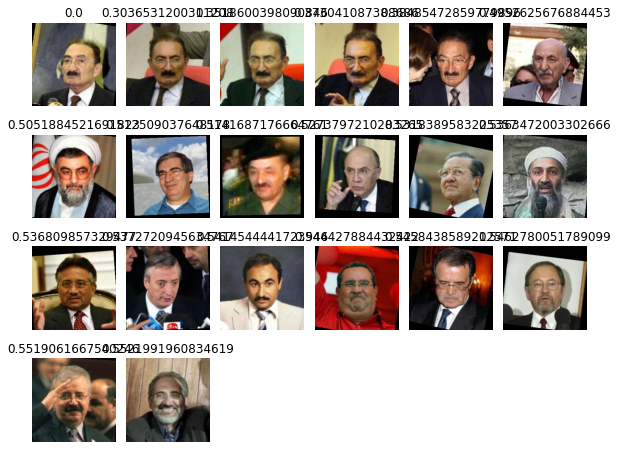

In [60]:
print("Bulent Ecevit \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Bulent_Ecevit/Bulent_Ecevit_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Calista Flockhart 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.8147264602847515, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.8460885015886391, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.8999071563848076, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.902775243894251, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.7644232622242785, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.8197662970335354, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.9109445632680975, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9109119041603031, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.876455098183621, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.8409099923528739, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.961596030882132, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.7432768886516998, 'code/lfw-de

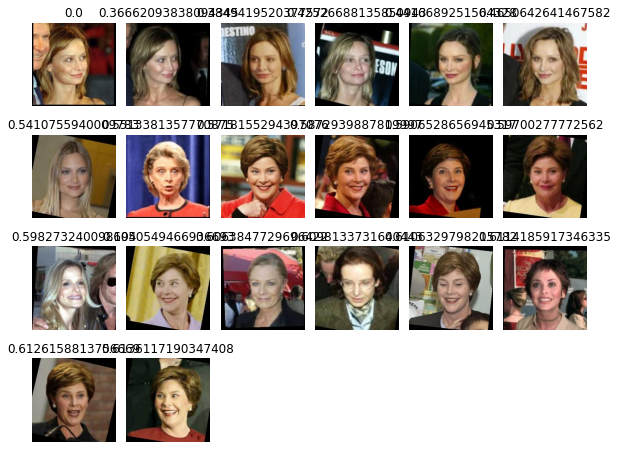

In [58]:
print("Calista Flockhart \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Calista_Flockhart/Calista_Flockhart_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Cameron Diaz 

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.8175116708604457, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.8783559508168378, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.8495155479294622, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 0.8076301900456573, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.7893522229213442, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.7757395495971013, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 0.8324600296922409, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.8790454305707832, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.8951614477885269, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.8437983824052591, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 0.90881145422446, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.86539469146173, 'code/lfw-deepfunn

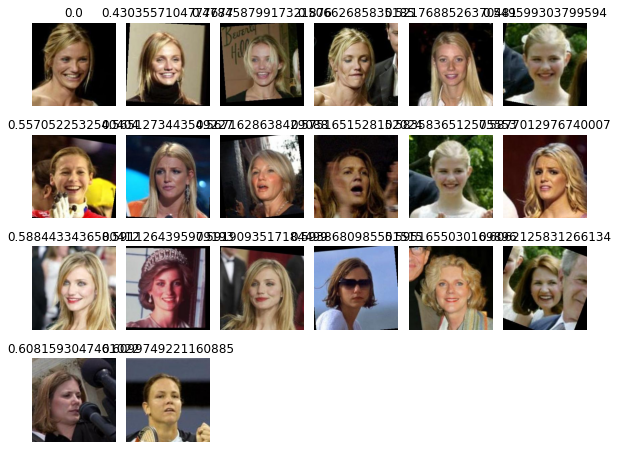

In [43]:
print("Cameron Diaz \n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Cameron_Diaz/Cameron_Diaz_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

Carmen Electra

{'code/lfw-deepfunneled/German_Khan/German_Khan_0001.jpg': 0.9096325153984535, 'code/lfw-deepfunneled/Stefano_Gabbana/Stefano_Gabbana_0001.jpg': 0.9709045594125849, 'code/lfw-deepfunneled/Dragan_Covic/Dragan_Covic_0001.jpg': 0.9140837642084929, 'code/lfw-deepfunneled/Jeff_Hornacek/Jeff_Hornacek_0001.jpg': 1.0065731909393485, 'code/lfw-deepfunneled/Sureyya_Ayhan/Sureyya_Ayhan_0001.jpg': 0.8140261737175938, 'code/lfw-deepfunneled/Deb_Santos/Deb_Santos_0001.jpg': 0.8292643939477963, 'code/lfw-deepfunneled/Bob_Newhart/Bob_Newhart_0001.jpg': 1.0101494319732145, 'code/lfw-deepfunneled/Wang_Hailan/Wang_Hailan_0001.jpg': 0.9397136830210512, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0002.jpg': 0.9236297363203859, 'code/lfw-deepfunneled/Paul_McNulty/Paul_McNulty_0001.jpg': 0.8901042407607769, 'code/lfw-deepfunneled/Jimmy_Iovine/Jimmy_Iovine_0001.jpg': 1.0181751238156904, 'code/lfw-deepfunneled/Claudia_Pechstein/Claudia_Pechstein_0001.jpg': 0.7236751046559236, 'code/lfw-dee

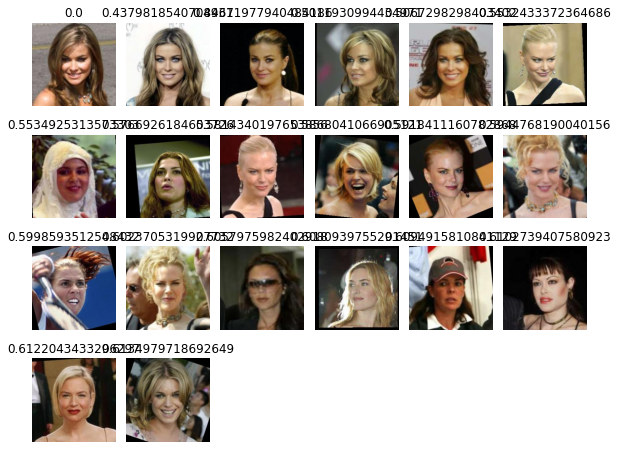

In [42]:
print("Carmen Electra\n")
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = "code/lfw-deepfunneled/Carmen_Electra/Carmen_Electra_0001.jpg"
# Extract its features
recognition = face_recognition.load_image_file(img)
en = face_recognition.face_encodings(recognition)
# Calculate the similarity (distance) between images
feat_dist = {}
for key in faces_encodings:
  if(len(faces_encodings[key])>0):      
    feat_dist[key] = np.linalg.norm(np.subtract(faces_encodings[key], en))

print(feat_dist)
# Extract 20 images that have lowest distance
sort_feature = sorted(feat_dist.items(), key=lambda x: x[1])
lowest_twenty = sort_feature[:20]

# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
i = 0
for a in lowest_twenty:
  i+=1
  score = a[1]
  axes.append(fig.add_subplot(5, 6, i))
  subplot_title=a[1]
  axes[-1].set_title(subplot_title)  
  plt.axis('off')
  plt.imshow(Image.open(a[0]))
fig.tight_layout()
plt.show()

#Documentation (40 points)

##Start 

We start this project off by first downloading the LFW Funneled dataset provided. here: http://vis-www.cs.umass.edu/lfw/ we chose LFW because they rotate the image so the face is always facing upright so it is easier to recognise. even the smalest tilt can change the distance between features extracted from the faces. thus having a straight up face is necessary. another thing that is neciserry is if the person is facing the camera or not. if you only see one side of the face the detector will have trouble trying to find a match of the person. as you can see with Arminio Fraga int query image only half of his face is visible thus the mathces where not that great.

##creating baseline

For the baseline we decided to use the basic tensorflow model to do the recognition of features. this is due to it not being the best and not the worst either. but when it comes to faces it can not do much except put features on eyhes and mouth. only rarly does that work as you can see in the baseline exsamples above. 
1. We first went through all the images and got all the featueres and stored them in a list so we can access them later. 
2. we get the query image and get its features just like before
3. we then find the distance between eatch feature and then normalise it with numpy so that its one number so we can easly sort in assending order. 
4. then we get the lowset 20 images and display to the user

As we have said above the basline does not do a really good job of really matching faces to faces but as a basline to reconice faces its great.

Read inline comments for step by step of the code.

##improving baseline with face recognition api

To improve our basline we used Face Recognitioin's Api: https://github.com/ageitgey/face_recognition?ref=hackernoon.com becasue it actually worked in our enviornment and we saw actual results. as we didnt have to use anyother models we could just call Face Recognition whcih would boudn box the faces and plot important facial features at once. As this was an all in one the time to go throuhg all the images and find all features drastically deacreased. even then it would still be idle to have the features ready for all the images before you start querying.
1. implement Face recfnition api instead of tensorflow model 
2. do the same for the query image to find its features
3. now just like before we find the distance between eatch featuer and then normalise it with numpy
4. just like before we show the lowest 20 distanced featured images

This time around you will actually see same faces and similar faces as compared to the baseline. 

Read inline comments for step by step.